In [1]:
# v5 is Data is with oversampling and withoutPCA, dealing with colinearity

In [1]:
#from tqdm import tqdm

import pandas as pd
import numpy as np
import re

import matplotlib.pyplot as plt


import seaborn as sns
sns.set(font_scale=1.5)
import scikitplot as skplt
import pydotplus


from matplotlib.colors import ListedColormap
cmap = ListedColormap(sns.color_palette("husl", 3))


from sklearn.pipeline import Pipeline
#from sklearn.feature_extraction.text import CountVectorizer
#from sklearn.feature_extraction.text import TfidfVectorizer

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, classification_report, confusion_matrix
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier


from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, KFold

plt.style.use('fivethirtyeight')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor  

import warnings
import scipy.stats as stats
from sklearn.tree import DecisionTreeRegressor
from six import StringIO
from sklearn.tree import export_graphviz


plt.rc("figure", figsize=(9, 7))

warnings.simplefilter('ignore')

from sklearn.ensemble import BaggingRegressor, RandomForestRegressor
from sklearn.ensemble import AdaBoostClassifier, AdaBoostRegressor, GradientBoostingClassifier, GradientBoostingRegressor

pd.set_option('display.max_columns', 500)   # to display 500 columns
pd.set_option('display.max_rows', 500)      # to display 500 rows

import time
from datetime import datetime

from sklearn.svm import SVC

import joblib
import pickle

from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier

### Uploading X_train, X_test, y_train, y_test to run the models

In [2]:
X_train_pca = pd.read_csv('X_train.csv') #, header=False, inferSchema=True)

#X_train_pca = pd.read_csv('X_train_pca.csv') #, header=False, inferSchema=True)
del X_train_pca['Unnamed: 0']

#X_train_pca.pop('NUM_INPT_ADM')

print(X_train_pca.shape)
X_train_pca.head(2)

(567470, 44)


,BENE_SEX_IDENT_CD,BENE_RACE_CD,END_STAGE_RENAL2008,END_STAGE_RENAL2009,SP_ALZHDMTA2008,SP_ALZHDMTA2009,SP_CHF2008,SP_CHF2009,SP_CHRNKIDN2008,SP_CHRNKIDN2009,SP_CNCR2008,SP_CNCR2009,SP_COPD2008,SP_COPD2009,SP_DEPRESSN2008,SP_DEPRESSN2009,SP_DIABETES2008,SP_DIABETES2009,SP_ISCHMCHT2008,SP_ISCHMCHT2009,SP_OSTEOPRS2008,SP_OSTEOPRS2009,SP_RA_OA2008,SP_RA_OA2009,SP_STRKETIA2008,TOTAL_DIAGNOSIS2008,TOTAL_DIAGNOSIS2009,TOTAL_PAYMENT2008,TOTAL_PAYMENT2009,CHANGE_IN_PAYMEMT,CHANGE_IN_DIAGNOSIS,AGE,LOS,TOTAL_INPT_COST,TOTAL_INPT_DIAGNOSIS,TOTAL_INPT_PROCS,NUM_OPD_VISIT,TOTAL_OPD_COST,TOTAL_OPD_DIAGNOSIS,TOTAL_OPD_PROCS,TOTAL_OPD_HCPCS,TOTAL_QTY_DSPNSD_NUM,PTNT_PAY_RX_AMT,TOT_RX_CST_AMT
0,0.894013,-0.376112,-0.276447,-0.324129,0.488824,0.548117,0.631811,0.722251,0.438255,-1.957371,0.259995,0.297347,0.396833,0.432235,0.52114,0.570588,-1.278217,0.844847,0.851854,-1.047279,0.459553,-2.047699,0.426502,0.459052,0.217322,-0.500202,0.167999,-0.373756,-0.438020,-0.004502,0.964159,-2.688845,-0.402922,-0.435816,-0.512382,-0.389891,-0.231241,-0.176626,-0.399277,-0.033666,-0.354668,-0.755605,-0.712789,-0.643576
1,0.894013,-0.376112,-0.276447,-0.324129,0.488824,-1.824429,0.631811,-1.384560,0.438255,0.510889,-3.846233,-3.363078,0.396833,-2.313555,0.52114,0.570588,-1.278217,-1.183646,-1.173910,-1.047279,0.459553,-2.047699,0.426502,0.459052,-4.601474,0.723995,1.757393,0.362291,0.092998,-0.268787,1.548998,0.424751,-0.402922,-0.435816,-0.512382,-0.389891,-0.598411,-0.284830,-0.443283,-0.033666,-0.438605,-0.727146,-0.617502,-0.653561


In [3]:
y_train = pd.read_csv('y_train.csv') #, header=False, inferSchema=True)
del y_train['Unnamed: 0']

print(y_train.shape)
y_train.head(2)

(567470, 1)


,READMIT30_FLAG
0,1
1,1


In [4]:
X_test_pca = pd.read_csv('X_test.csv') #, header=False, inferSchema=True)
#X_test_pca = pd.read_csv('X_test_pca.csv') #, header=False, inferSchema=True)
del X_test_pca['Unnamed: 0']

#X_test_pca.pop('NUM_INPT_ADM')

print(X_test_pca.shape)
X_test_pca.head(2)

(91666, 44)


,BENE_SEX_IDENT_CD,BENE_RACE_CD,END_STAGE_RENAL2008,END_STAGE_RENAL2009,SP_ALZHDMTA2008,SP_ALZHDMTA2009,SP_CHF2008,SP_CHF2009,SP_CHRNKIDN2008,SP_CHRNKIDN2009,SP_CNCR2008,SP_CNCR2009,SP_COPD2008,SP_COPD2009,SP_DEPRESSN2008,SP_DEPRESSN2009,SP_DIABETES2008,SP_DIABETES2009,SP_ISCHMCHT2008,SP_ISCHMCHT2009,SP_OSTEOPRS2008,SP_OSTEOPRS2009,SP_RA_OA2008,SP_RA_OA2009,SP_STRKETIA2008,TOTAL_DIAGNOSIS2008,TOTAL_DIAGNOSIS2009,TOTAL_PAYMENT2008,TOTAL_PAYMENT2009,CHANGE_IN_PAYMEMT,CHANGE_IN_DIAGNOSIS,AGE,LOS,TOTAL_INPT_COST,TOTAL_INPT_DIAGNOSIS,TOTAL_INPT_PROCS,NUM_OPD_VISIT,TOTAL_OPD_COST,TOTAL_OPD_DIAGNOSIS,TOTAL_OPD_PROCS,TOTAL_OPD_HCPCS,TOTAL_QTY_DSPNSD_NUM,PTNT_PAY_RX_AMT,TOT_RX_CST_AMT
0,0.894013,-0.376112,-0.276447,-0.324129,0.488824,-1.824429,-1.582752,-1.38456,0.438255,-1.957371,0.259995,0.297347,0.396833,0.432235,-1.918871,-1.752579,-1.278217,-1.183646,-1.173910,-1.047279,-2.176028,-2.047699,0.426502,0.459052,0.217322,1.132061,1.757393,-0.004429,0.464108,0.386541,0.964159,-0.692950,-0.402922,-0.435816,-0.512382,-0.389891,-0.843190,-0.388587,-0.795328,-0.033666,-0.774351,-0.880114,-0.792195,-0.740933
1,-1.118552,-0.376112,-0.276447,-0.324129,0.488824,0.548117,0.631811,-1.38456,0.438255,0.510889,0.259995,0.297347,0.396833,0.432235,0.521140,-1.752579,0.782340,0.844847,0.851854,0.954856,0.459553,0.488353,0.426502,0.459052,0.217322,-0.908268,-0.229349,-0.276427,-0.323368,-0.002845,0.964159,-0.213935,3.895126,0.202113,0.585481,1.014796,1.726994,0.629717,1.448959,-0.033666,0.862411,-0.794736,-0.649265,-0.513766


In [5]:
y_test = pd.read_csv('y_test.csv') #, header=False, inferSchema=True)
del y_test['Unnamed: 0']

print(y_test.shape)
y_test.head(2)

(91666, 1)


,READMIT30_FLAG
0,1
1,0


### Baseline Accuracy

In [6]:
# Baseline Accuracy

y_train.READMIT30_FLAG.value_counts(normalize=True) 

1    0.5
0    0.5
Name: READMIT30_FLAG, dtype: float64

### Instead of fitting the models - I am uploading already fitted models which were run on AWS

In [ ]:
#import joblib
#import pickle

# Base models
modelLR_base = joblib.load('modelLR_base.jlib')
modelDT_base = joblib.load('modelDT_base.jlib')
modelRF_base = joblib.load('modelRF_base.jlib')
knn_base = joblib.load('knn_base.jlib')
modelSVM_base = joblib.load('modelSVM_base.jlib')

# Gridsearched models
lr_gridsearch = joblib.load('lr_gridsearch.jlib')
DT_Classifier_gridsearch = joblib.load('DT_Classifier_gridsearch.jlib')
modelRF_GS = joblib.load('modelRF_GS.jlib')

In [37]:
#modelknn_base = joblib.load('modelknn_base.jlib')
#modelDT_base = joblib.load('modelDT_base.jlib')

#modelRF_GS = joblib.load('modelRF_GS.jlib')
#DT_Classifier_gridsearch = joblib.load('DT_Classifier_gridsearch.jlib')

### Building base Logistic Regression model for readmission prediction

In [13]:
modelLR_base = LogisticRegression()
modelLR_base.fit(X_train_pca,y_train)

LogisticRegression()

In [14]:
train_score_LR_base = modelLR_base.score(X_train_pca, y_train)
trainCV_score_LR_base = cross_val_score(modelLR_base, X_train_pca, y_train, cv =5).mean()
test_score_LR_base = modelLR_base.score(X_test_pca, y_test)

print("Logistic Regression Score(Train): ", train_score_LR_base)
print("Logistic Regression Cross Val Score (Train): ", trainCV_score_LR_base) 
print("Logistic RegressionScore (Test): ", test_score_LR_base)

Logistic Regression Score(Train):  0.854563236823092
Logistic Regression Cross Val Score (Train):  0.8541085872380918
Logistic RegressionScore (Test):  0.8498243623589989


In [15]:
importance = modelLR_base.coef_[0]
                  
importanceDF = pd.DataFrame({'variable': X_train_pca.columns,
                             'coef': importance,
                             'abs_coef': np.abs(importance), 
                            })
importanceDF.sort_values(by='abs_coef', ascending=False).head(12)

,variable,coef,abs_coef
34,TOTAL_INPT_DIAGNOSIS,-1.373294,1.373294
32,LOS,0.527373,0.527373
33,TOTAL_INPT_COST,-0.380266,0.380266
36,NUM_OPD_VISIT,-0.375777,0.375777
41,TOTAL_QTY_DSPNSD_NUM,-0.213561,0.213561
43,TOT_RX_CST_AMT,0.155272,0.155272
37,TOTAL_OPD_COST,0.118745,0.118745
38,TOTAL_OPD_DIAGNOSIS,0.088046,0.088046
40,TOTAL_OPD_HCPCS,-0.066566,0.066566
42,PTNT_PAY_RX_AMT,-0.030461,0.030461


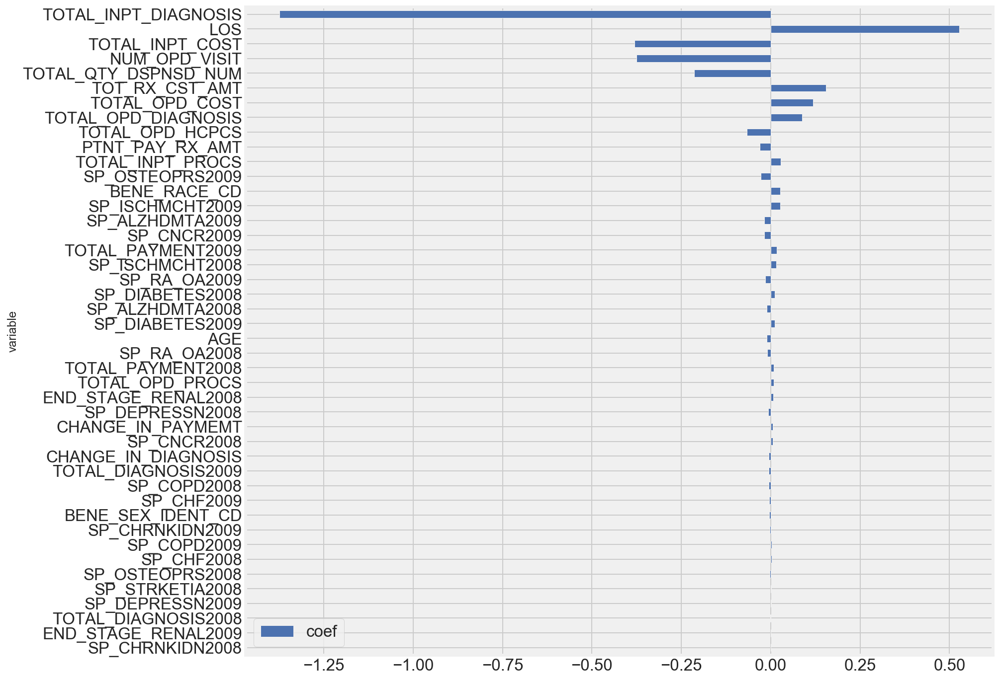

In [16]:
#importanceDF.sort_values(by='abs_coef', ascending=True).plot(kind='barh', figsize=(20, 10))

importanceDF.sort_values(by='abs_coef', ascending=True).plot(kind='barh', x='variable', y='coef',
                      color='b', figsize=(12, 12))
plt.show()

In [41]:
# Saving logistic regression base model 

joblib.dump(modelLR_base, 'modelLR_base.jlib')

['modelLR_base.jlib']

#### Since Logistic Regression is not the best performing, now trying Polynomial Regression

In [6]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree = 2, interaction_only=False, include_bias=False)

X_train_poly = poly.fit_transform(X_train_pca)
X_test_poly = poly.fit_transform(X_test_pca)

print(X_train_poly.shape)
print(X_test_poly.shape)

(567470, 1080)
(91666, 1080)


In [43]:
modelLR_polynomial = LogisticRegression()
modelLR_polynomial.fit(X_train_poly,y_train)

LogisticRegression()

In [44]:
train_score_LR_polynomial_base = modelLR_polynomial.score(X_train_poly, y_train)
trainCV_score_LR_polynomial_base = cross_val_score(modelLR_polynomial, X_train_poly, y_train, cv =5).mean()
test_score_LR_polynomial_base = modelLR_polynomial.score(X_test_poly, y_test)

print("Polynomial LogisticRegression Score(Train): ", train_score_LR_polynomial_base)
print("Polynomial LogisticRegression Cross Val Score (Train): ", trainCV_score_LR_polynomial_base) 
print("Polynomial LogisticRegression Score (Test): ", test_score_LR_polynomial_base)

Polynomial LogisticRegression Score(Train):  0.9646536380777838
Polynomial LogisticRegression Cross Val Score (Train):  0.9644315999083652
Polynomial LogisticRegression Score (Test):  0.9512905548403988


In [81]:
importance_LR_polynomial = modelLR_polynomial.coef_[0]
                  
importanceDF_LR_polynomial = pd.DataFrame({  #'variable': X_train_poly.columns,
                             'coef': importance,
                             'abs_coef': np.abs(importance), 
                            })
importanceDF_LR_polynomial.sort_values(by='abs_coef', ascending=False).head(12)

,coef,abs_coef
33,-2.790982,2.790982
35,-2.341938,2.341938
1002,1.633830,1.633830
34,-1.193152,1.193152
1004,1.183263,1.183263
1025,0.669303,0.669303
32,-0.662077,0.662077
990,0.563372,0.563372
1003,0.431487,0.431487
991,-0.428588,0.428588


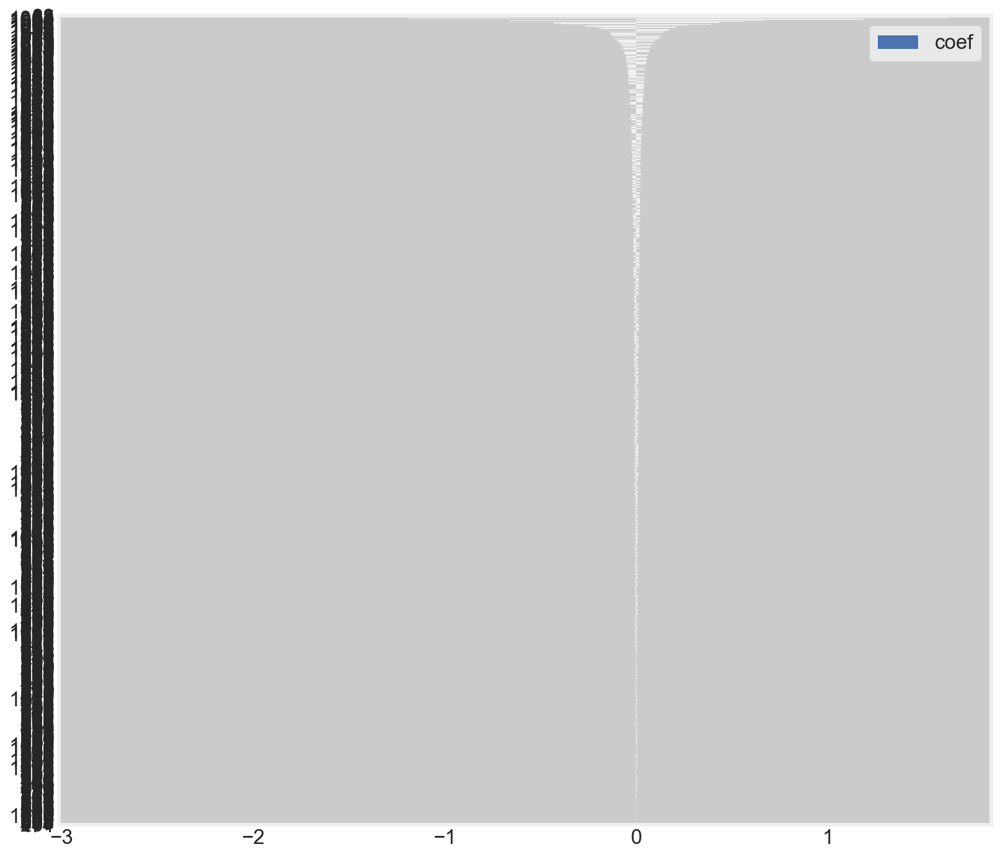

In [52]:
importanceDF.sort_values(by='abs_coef', ascending=True).plot(kind='barh',  y='coef', #x='variable',
                      color='b', figsize=(12, 12))
plt.show()

In [53]:
# Predictons and Probabilities

predictions_LRBase_poly = modelLR_polynomial.predict(X_test_poly)
#predictions_LRBase_poly

probabilities_LRBase_poly = modelLR_polynomial.predict_proba(X_test_poly)
#probabilities_LRBase_poly

In [54]:
labels=[0, 1]
confusion_mat = confusion_matrix(y_test, predictions_LRBase_poly, labels=labels) # it is imp to put labels else its confusing
#print(labels)
#print(confusion_mat)

pd.DataFrame(confusion_mat,
             columns=['Predicted_No_Readmissions', 'Predicted_Readmissions'],
             index=  ['True_No_Readmissions', 'True_Readmissions'])

,Predicted_No_Readmissions,Predicted_Readmissions
True_No_Readmissions,20323,409
True_Readmissions,4056,66878


In [55]:
print(classification_report(y_test, predictions_LRBase_poly))

              precision    recall  f1-score   support

           0       0.83      0.98      0.90     20732
           1       0.99      0.94      0.97     70934

    accuracy                           0.95     91666
   macro avg       0.91      0.96      0.93     91666
weighted avg       0.96      0.95      0.95     91666



In [56]:
def plot_f1_lines(figsize=(8,6),fontsize=16):
    '''Create f1-score level lines to be added to the precison-recall plot'''

    fig, ax = plt.subplots(figsize=figsize)
    
    # add lines of constant F1 scores
    
    for const in np.linspace(0.2,0.9,8):
        x_vals = np.linspace(0.001, 0.999, 100)
        y_vals = 1./(2./const-1./x_vals)
        ax.plot(x_vals[y_vals > 0], y_vals[y_vals > 0],
                 color='lightblue', ls='--', alpha=0.9)
        ax.set_ylim([0, 1])
        ax.annotate('f1={0:0.1f}'.format(const),
                     xy=(x_vals[-10], y_vals[-2]+0.0), fontsize=fontsize)

    return fig, ax

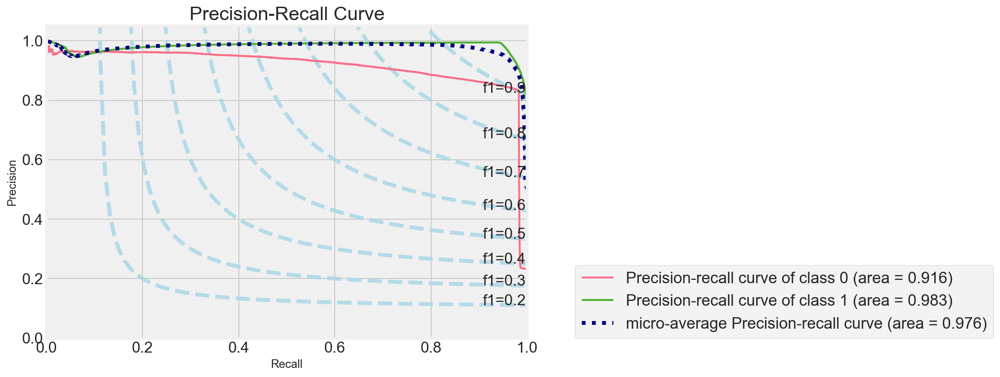

In [57]:
# plot_f1_lines # already defined

# Recall Precision plot

fig, ax = plot_f1_lines()
skplt.metrics.plot_precision_recall(y_test, probabilities_LRBase_poly, 
                       plot_micro=True, 
                       title_fontsize=20, text_fontsize=16, cmap=cmap, ax=ax)
ax.legend(loc=[1.1,0])
plt.show()

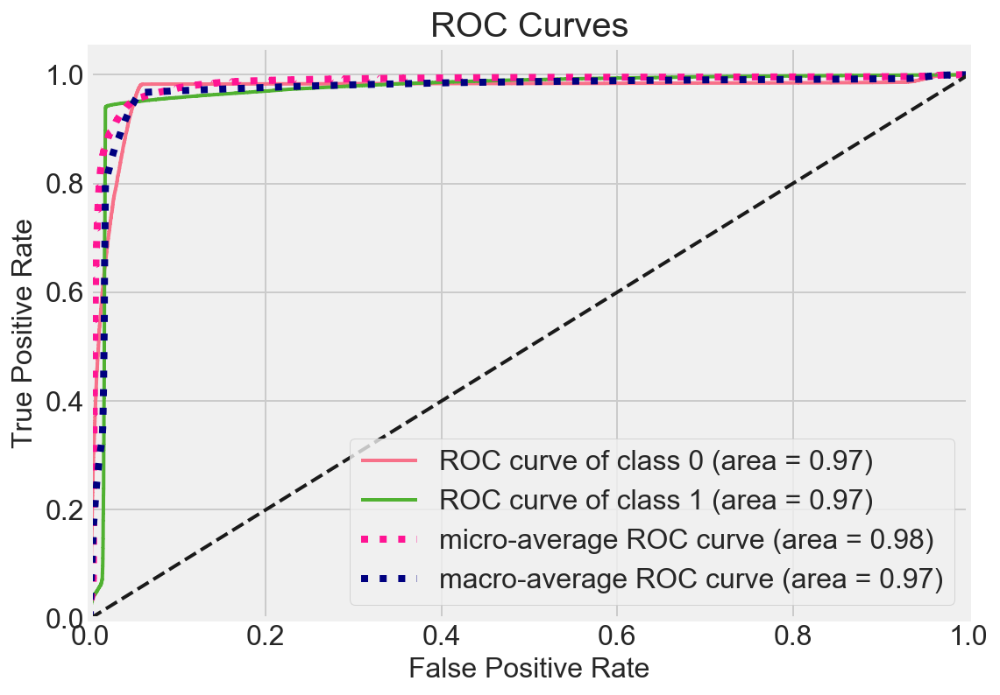

In [58]:
# ROC plot

skplt.metrics.plot_roc(y_test, probabilities_LRBase_poly, plot_micro=True, plot_macro=True, 
                       title_fontsize=20, text_fontsize=16, figsize=(8,6), cmap=cmap)
plt.show()

In [59]:
# Saving polynomial logistic regreesion model 

joblib.dump(modelLR_polynomial, 'modelLR_polynomial_base.jlib')

['modelLR_polynomial_base.jlib']

### Ploynomial Logistic Regression GridSearch

In [7]:
from sklearn.utils.class_weight import compute_class_weight

gs_lr_params = {'penalty': ['l1', 'l2'],#, 'elasticnet'],
                'solver': ['liblinear', 'saga', 'lbfgs'],
                'C': np.logspace(-3, 4, 3),  #np.logspace(-3, 0, 100)}  
                #'class_weight':['balanced'] # already balanced with SMOTE
               }

model_LR_poly_GS = LogisticRegression(solver='liblinear', multi_class='ovr')

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

lr_gridsearch = GridSearchCV(estimator=model_LR_poly_GS,
                             param_grid=gs_lr_params,
                             cv=kf,
                             scoring='accuracy',
                             n_jobs=3,     
                             verbose=1,
                             refit=True)

In [8]:
lr_gridsearch.fit(X_train_poly, y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/Users/abhi/opt/anaconda3/lib/python3.7/site-packages/joblib/parallel.py", line 833, in retrieve
    self._output.extend(job.get(timeout=self.timeout))
  File "/Users/abhi/opt/anaconda3/lib/python3.7/site-packages/joblib/_parallel_backends.py", line 521, in wrap_future_result
    return future.result(timeout=timeout)
  File "/Users/abhi/opt/anaconda3/lib/python3.7/concurrent/futures/_base.py", line 430, in result
    self._condition.wait(timeout)
  File "/Users/abhi/opt/anaconda3/lib/python3.7/threading.py", line 296, in wait
    waiter.acquire()
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/Users/abhi/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3326, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-8-163e89c19d8e>", line 1, in <module>
    lr_gridsearch.fit(X_train_poly, y_train)
 

TypeError: can only concatenate str (not "list") to str

In [ ]:
print('Best Paramaters (logistic Regression): ', lr_gridsearch.best_params_)
print('Best Score (logistic Regression): ', lr_gridsearch.best_score_)
print('Best Logistic Regression: ' , lr_gridsearch.best_estimator_)

In [ ]:
test_score_LR_polynomial_GS = lr_gridsearch.score(X_test_poly, y_test) 

print("Polynomial LogisticRegression GS Score (Test): ", test_score_LR_polynomial_GS)

In [ ]:
predictions_polyLR_GS = modelRF_GS.best_estimator_.predict(X_test_pca)
#predictions_polyLR_GS

probabilities_polyLR_GS = modelRF_GS.best_estimator_.predict_proba(X_test_pca)
#probabilities_polyLR_GS

In [ ]:
labels=[0, 1]
confusion_mat = confusion_matrix(y_test, predictions_polyLR_GS, labels=labels) # it is imp to put labels else its confusing
#print(labels)
#print(confusion_mat)

pd.DataFrame(confusion_mat,
             columns=['Predicted_No_Readmissions', 'Predicted_Readmissions'],
             index=['True_No_Readmissions', 'True_Readmissions'])

In [ ]:
# plot_f1_lines # already defined

# Recall Precision plot

fig, ax = plot_f1_lines()
skplt.metrics.plot_precision_recall(y_test, probabilities_polyLR_GS, 
                       plot_micro=True, 
                       title_fontsize=20, text_fontsize=16, cmap=cmap, ax=ax)
ax.legend(loc=[1.1,0])
plt.show()

In [ ]:
# ROC plot

skplt.metrics.plot_roc(y_test, probabilities_polyLR_GS, plot_micro=True, plot_macro=True, 
                       title_fontsize=20, text_fontsize=16, figsize=(8,6), cmap=cmap)
plt.show()

In [ ]:
joblib.dump(lr_gridsearch, 'lr_gridsearch.jlib')

## Random Forest

#### Random Forest Base Model

In [7]:
modelRF_base = RandomForestClassifier(max_depth=12) 
modelRF_base.fit(X_train_pca,y_train)

RandomForestClassifier(max_depth=12)

In [8]:
train_score_RF_base = modelRF_base.score(X_train_pca, y_train)
trainCV_score_RF_base = cross_val_score(modelRF_base, X_train_pca, y_train, cv =5).mean()
test_score_RF_base = modelRF_base.score(X_test_pca, y_test)

print("Random Forest Base Score(Train): ", train_score_RF_base)
print("Random Forest Base Cross Val Score (Train): ", trainCV_score_RF_base) 
print("Random Forest Base Score (Test): ", test_score_RF_base)

Random Forest Base Score(Train):  0.9705306007366028
Random Forest Base Cross Val Score (Train):  0.965712724901757
Random Forest Base Score (Test):  0.9532214779743853


In [9]:
importance_RFbase = modelRF_base.feature_importances_
                  
importanceDF_RFbase = pd.DataFrame({'variable': X_train_pca.columns,
                             'coef': importance_RFbase,
                             'abs_coef': np.abs(importance_RFbase), 
                            })
importanceDF_RFbase.sort_values(by='abs_coef', ascending=False).head(12)

,variable,coef,abs_coef
34,TOTAL_INPT_DIAGNOSIS,0.371900,0.371900
33,TOTAL_INPT_COST,0.265717,0.265717
32,LOS,0.175296,0.175296
35,TOTAL_INPT_PROCS,0.077194,0.077194
36,NUM_OPD_VISIT,0.026509,0.026509
40,TOTAL_OPD_HCPCS,0.022730,0.022730
37,TOTAL_OPD_COST,0.018911,0.018911
38,TOTAL_OPD_DIAGNOSIS,0.011083,0.011083
41,TOTAL_QTY_DSPNSD_NUM,0.010519,0.010519
42,PTNT_PAY_RX_AMT,0.006974,0.006974


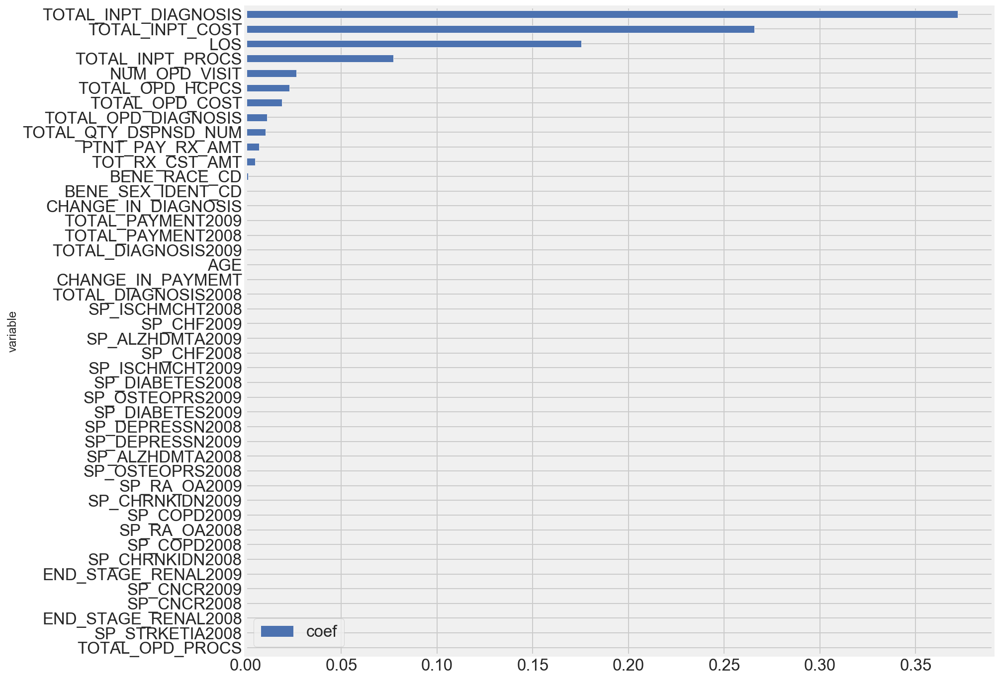

In [10]:
importanceDF_RFbase.sort_values(by='abs_coef', ascending=True).plot(kind='barh',  y='coef', x='variable',
                      color='b', figsize=(12, 12))
plt.show()

In [85]:
# TEMPLATE CODE
from six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus

def plot_dt(dt, feature_names=None):
    print('Max depth:', dt.max_depth)
    dot_data = StringIO()
    export_graphviz(dt,
                    out_file=dot_data,
                    filled=True,
                    rounded=True,
                    special_characters=True,
                    feature_names=feature_names
                    )

    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return Image(graph.create_png())

In [87]:
modelRF_base.max_depth

#plot_dt(modelRF_base, feature_names=X_train_pca.columns)

12

In [88]:
joblib.dump(modelRF_base, 'modelRF_base.jlib')

['modelRF_base.jlib']

In [ ]:
''' # when ran withoOUT vectorizer - RF (but WITH gini and 100 estimators)

Score(Train):  1.0
Cross Val Score (Train):  0.9432718529372724
Score (Test):  0.9421599441243234
    
# when ran withoOUT vectorizer - RF (but WITHout gini and 100 estimators)

Score(Train):  0.9972236010276494  (28 PCA)
Cross Val Score (Train):  0.9416274400747433
Score (Test):  0.9416141208299696
    
# when ran WITH vectorizer - RF  (but without gini and 100 estimators)

Score(Train):  0.9970763264259727
Cross Val Score (Train):  0.8548963139654087
Score (Test):  0.858278969301595
    
# when ran WITH vectorizer - RF  (but WITH gini and 100 estimators)

Score(Train):  1
Cross Val Score (Train):  
Score (Test): 
'''

### Random Forest Grid Search

In [9]:
param_grid_RF = { 
                    'n_estimators': [10, 100, 200],
                    'max_features': ['auto'],# 'sqrt', 'log2'],
                    'max_depth' : [2,4,6,8,10,12],  #  20,10, None]  # limiting overfit by removng None
                    'criterion' :['gini', 'entropy']
                    #,'ccp_alpha':[]                  # for pruing
                    # 'class_weight':['balanced']     # SMOTE done, so dont require this
                }

In [10]:
modelRF_ = RandomForestClassifier(random_state=1) 

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

modelRF_GS = GridSearchCV(estimator=modelRF_,
                          param_grid=param_grid_RF, 
                          cv=kf, 
                          scoring='accuracy',
                          n_jobs=3,     
                          verbose=1,
                          refit=True
                         )

modelRF_GS.fit(X_train_pca, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:  9.1min
[Parallel(n_jobs=3)]: Done 180 out of 180 | elapsed: 56.4min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=1, shuffle=True),
             estimator=RandomForestClassifier(random_state=1), n_jobs=3,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, 12],
                         'max_features': ['auto'],
                         'n_estimators': [10, 100, 200]},
             scoring='accuracy', verbose=1)

In [11]:
print("Best score (Random Forest GS): ", modelRF_GS.best_score_)
print("Best params (Random Forest GS): ", modelRF_GS.best_params_)
print("Best estimator (Random Forest GS): ", modelRF_GS.best_estimator_)

Best score (Random Forest GS):  0.9731210460464871
Best params (Random Forest GS):  {'criterion': 'entropy', 'max_depth': 12, 'max_features': 'auto', 'n_estimators': 100}
Best estimator (Random Forest GS):  RandomForestClassifier(criterion='entropy', max_depth=12, random_state=1)


In [12]:
test_score_RF_GS = modelRF_GS.best_estimator_.score(X_test_pca,y_test)

print("Random Forest GS Score (Test): ", test_score_RF_GS)

Random Forest GS Score (Test):  0.96036698448716


In [22]:
importance_RF_GS = modelRF_GS.best_estimator_.feature_importances_
                  
importance_RF_GS_DF = pd.DataFrame({'variable': X_train_pca.columns,
                             'coef': importance_RF_GS,
                             'abs_coef': np.abs(importance_RF_GS), 
                            })
importance_RF_GS_DF.sort_values(by='abs_coef', ascending=False).head(12)

,variable,coef,abs_coef
33,NUM_INPT_ADM,0.337802,0.337802
34,TOTAL_INPT_COST,0.201976,0.201976
35,TOTAL_INPT_DIAGNOSIS,0.191428,0.191428
32,LOS,0.131831,0.131831
36,TOTAL_INPT_PROCS,0.049991,0.049991
39,TOTAL_OPD_DIAGNOSIS,0.022202,0.022202
38,TOTAL_OPD_COST,0.017641,0.017641
37,NUM_OPD_VISIT,0.016180,0.016180
44,TOT_RX_CST_AMT,0.007411,0.007411
41,TOTAL_OPD_HCPCS,0.007399,0.007399


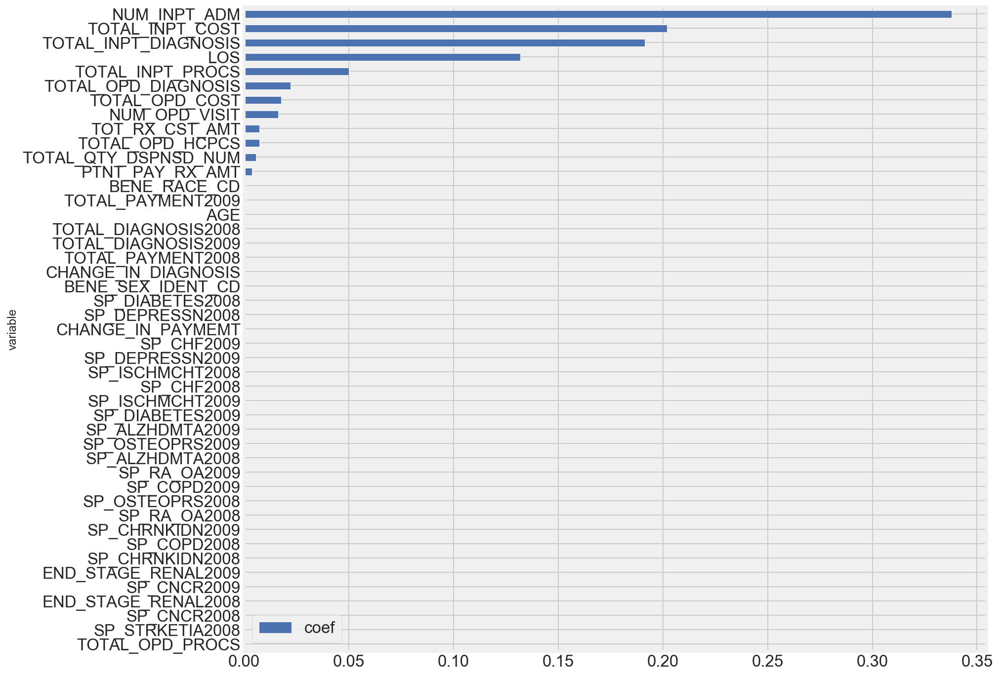

In [23]:
importance_RF_GS_DF.sort_values(by='abs_coef', ascending=True).plot(kind='barh',  y='coef', x='variable',
                      color='b', figsize=(12, 12))
plt.show()

In [15]:
predictions_RF_GS = modelRF_GS.best_estimator_.predict(X_test_pca)
#predictions_RF_GS

probabilities_RF_GS = modelRF_GS.best_estimator_.predict_proba(X_test_pca)
#probabilities_RF_GS

In [16]:
labels=[0, 1]
confusion_mat = confusion_matrix(y_test, predictions_RF_GS, labels=labels) # it is imp to put labels else its confusing
#print(labels)
#print(confusion_mat)

pd.DataFrame(confusion_mat,
             columns=['Predicted_No_Readmissions', 'Predicted_Readmissions'],
             index=['True_No_Readmissions', 'True_Readmissions'])

,Predicted_No_Readmissions,Predicted_Readmissions
True_No_Readmissions,19509,1223
True_Readmissions,2410,68524


In [17]:
print(classification_report(y_test, predictions_RF_GS))

              precision    recall  f1-score   support

           0       0.89      0.94      0.91     20732
           1       0.98      0.97      0.97     70934

    accuracy                           0.96     91666
   macro avg       0.94      0.95      0.94     91666
weighted avg       0.96      0.96      0.96     91666



In [18]:
def plot_f1_lines(figsize=(8,6),fontsize=16):
    '''Create f1-score level lines to be added to the precison-recall plot'''

    fig, ax = plt.subplots(figsize=figsize)
    
    # add lines of constant F1 scores
    
    for const in np.linspace(0.2,0.9,8):
        x_vals = np.linspace(0.001, 0.999, 100)
        y_vals = 1./(2./const-1./x_vals)
        ax.plot(x_vals[y_vals > 0], y_vals[y_vals > 0],
                 color='lightblue', ls='--', alpha=0.9)
        ax.set_ylim([0, 1])
        ax.annotate('f1={0:0.1f}'.format(const),
                     xy=(x_vals[-10], y_vals[-2]+0.0), fontsize=fontsize)

    return fig, ax

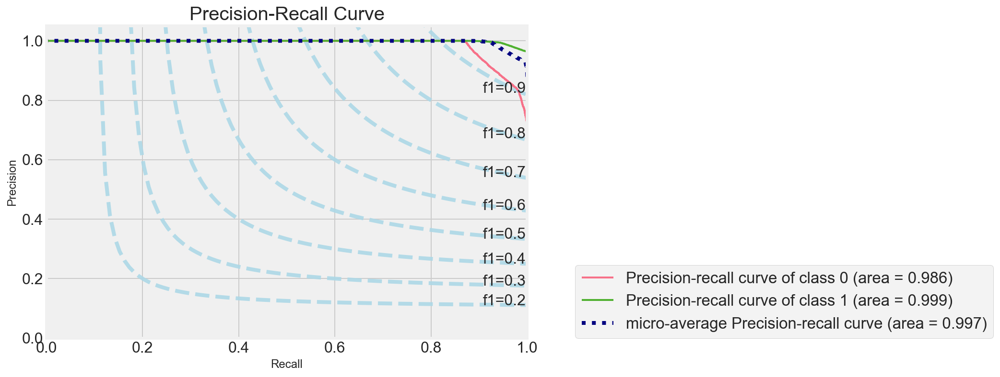

In [19]:
# Recall Precision plot

fig, ax = plot_f1_lines()
skplt.metrics.plot_precision_recall(y_test, probabilities_RF_GS, 
                       plot_micro=True, 
                       title_fontsize=20, text_fontsize=16, cmap=cmap, ax=ax)
ax.legend(loc=[1.1,0])
plt.show()

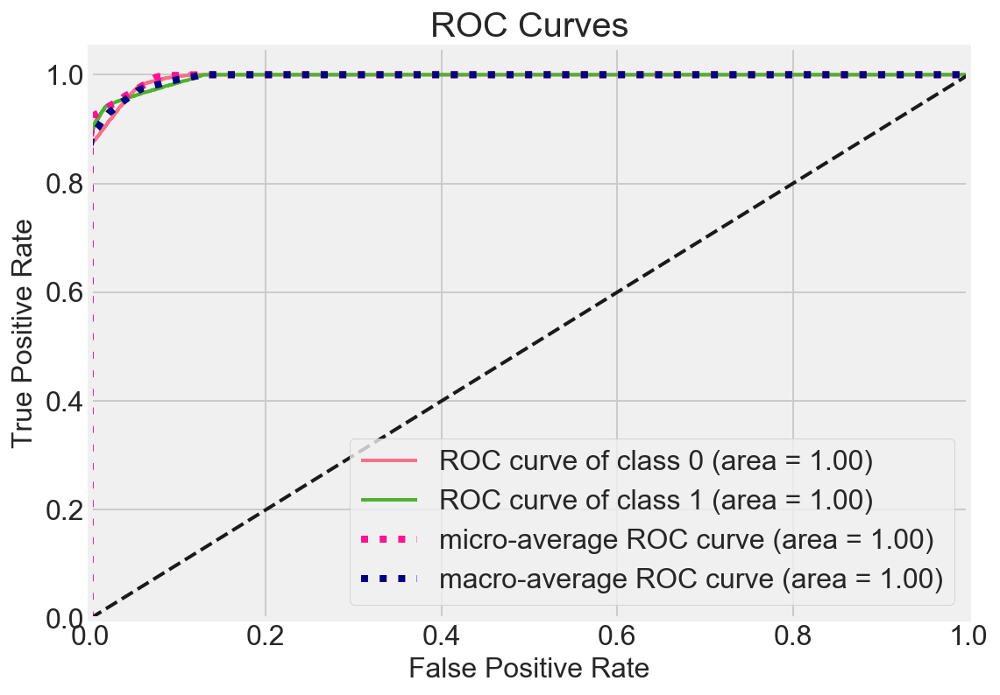

In [20]:
# ROC plot

skplt.metrics.plot_roc(y_test, probabilities_RF_GS, plot_micro=True, plot_macro=True, 
                       title_fontsize=20, text_fontsize=16, figsize=(8,6), cmap=cmap)
plt.show()

In [21]:
joblib.dump(modelRF_GS, 'modelRF_GS.jlib')

['modelRF_GS.jlib']

### Decison Tree

#### Decision Tree - Base model

In [17]:
# DT Base model

modelDT_base = DecisionTreeRegressor(max_depth=12)     #criterion='mse',  max_depth=None, random_state=1
modelDT_base.fit(X_train_pca, y_train)

DecisionTreeRegressor(max_depth=12)

In [18]:
train_score_DT_base = modelDT_base.score(X_train_pca, y_train)
trainCV_score_DT_base = cross_val_score(modelDT_base, X_train_pca, y_train, cv =5).mean()
test_score_DT_base = modelDT_base.score(X_test_pca, y_test)

print("Decision Tree Base Score(Train): ", train_score_DT_base)
print("Decision Tree Base Cross Val Score (Train): ", trainCV_score_DT_base) 
print("Decision Tree Base Score (Test): ", test_score_DT_base)

Decision Tree Base Score(Train):  0.9389437381463898
Decision Tree Base Cross Val Score (Train):  0.7018666543472196
Decision Tree Base Score (Test):  0.8632775706708368


In [19]:
modelDT_base.feature_importances_

array([0.00000000e+00, 1.88273348e-04, 7.57503215e-06, 2.86271925e-05,
       1.01568224e-05, 3.69324702e-05, 5.56517186e-05, 8.04533602e-05,
       5.96546651e-06, 1.53689102e-05, 9.93870469e-06, 1.12607878e-05,
       2.19809217e-05, 0.00000000e+00, 1.66924619e-05, 0.00000000e+00,
       6.08228939e-07, 3.53901491e-05, 0.00000000e+00, 0.00000000e+00,
       1.46390241e-05, 5.20415624e-06, 0.00000000e+00, 2.06123630e-04,
       0.00000000e+00, 5.45154546e-05, 5.64195997e-04, 2.14848694e-04,
       2.08739706e-04, 1.58469960e-04, 1.20478825e-04, 2.66805828e-04,
       4.15491546e-04, 1.37519807e-03, 9.93959800e-01, 3.12247320e-04,
       1.01833722e-04, 3.41473715e-04, 2.09066083e-04, 6.48356313e-06,
       1.88989775e-04, 3.02541431e-04, 2.22371314e-04, 2.25606405e-04])

In [20]:
importance_DTbase = modelDT_base.feature_importances_
                  
importanceDF_DTbase = pd.DataFrame({'variable': X_train_pca.columns,
                             'coef': importance_DTbase,
                             'abs_coef': np.abs(importance_DTbase), 
                            })
importanceDF_DTbase.sort_values(by='abs_coef', ascending=False).head(12)

,variable,coef,abs_coef
34,TOTAL_INPT_DIAGNOSIS,0.993960,0.993960
33,TOTAL_INPT_COST,0.001375,0.001375
26,TOTAL_DIAGNOSIS2009,0.000564,0.000564
32,LOS,0.000415,0.000415
37,TOTAL_OPD_COST,0.000341,0.000341
35,TOTAL_INPT_PROCS,0.000312,0.000312
41,TOTAL_QTY_DSPNSD_NUM,0.000303,0.000303
31,AGE,0.000267,0.000267
43,TOT_RX_CST_AMT,0.000226,0.000226
42,PTNT_PAY_RX_AMT,0.000222,0.000222


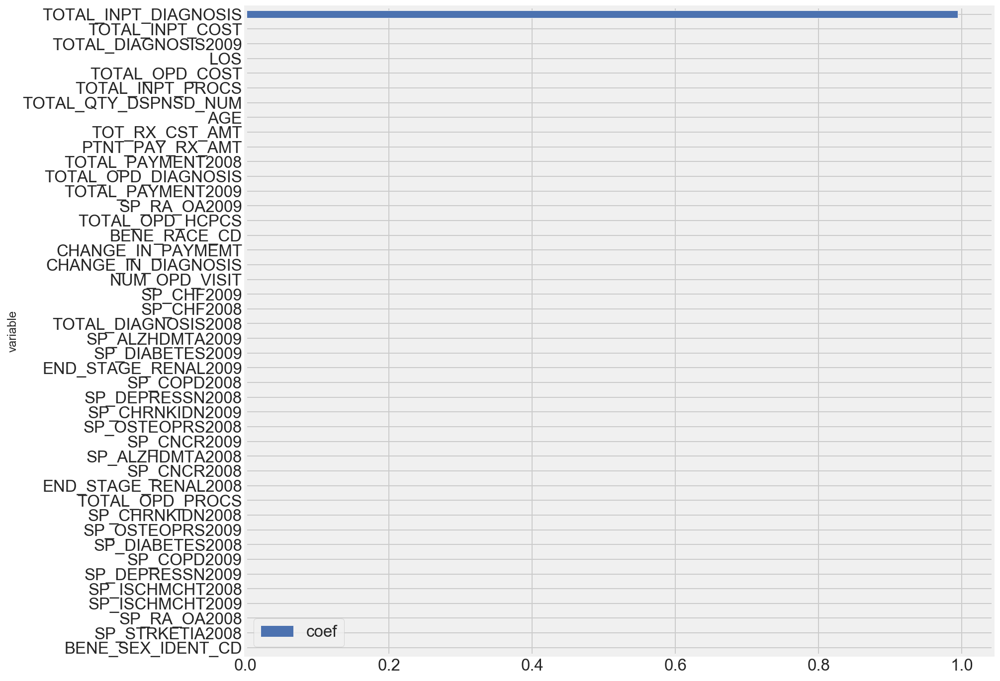

In [21]:
importanceDF_DTbase.sort_values(by='abs_coef', ascending=True).plot(kind='barh',  y='coef', x='variable',
                      color='b', figsize=(12, 12))
plt.show()

In [ ]:
# to do

#predict
#predict_proba

# Confusion matrix, clasfication report and ROC, AUC plots

In [67]:
# TEMPLATE CODE
from six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus

def plot_dt(dt, feature_names=None):
    print('Max depth:', dt.max_depth)
    dot_data = StringIO()
    export_graphviz(dt,
                    out_file=dot_data,
                    filled=True,
                    rounded=True,
                    special_characters=True,
                    feature_names=feature_names
                    )

    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return Image(graph.create_png())

Max depth: 12


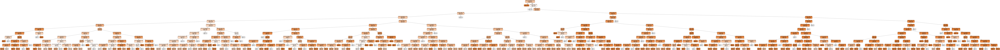

In [68]:
# initialize the output file object

plot_dt(modelDT_base, feature_names=X_train_pca.columns)

In [62]:
joblib.dump(modelDT_base, 'modelDT_base.jlib')

['modelDT_base.jlib']

In [19]:
from six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus


# initialize the output file object
dot_data = StringIO()

modelDT_base.max_depth

8

In [20]:
# my fit DecisionTreeRegressor object here is: dtr1
# for feature_names i put the columns of my Xr matrix

def plot_dt(dt, feature_names=None):
    print('Max depth:', dt.max_depth)
    dot_data = StringIO()
    export_graphviz(dt,
                    out_file=dot_data,
                    filled=True,
                    rounded=True,
                    special_characters=True,
                    feature_names=feature_names
                    )

    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return Image(graph.create_png())

In [69]:
X_train_pca.head(2)

,BENE_SEX_IDENT_CD,BENE_RACE_CD,END_STAGE_RENAL2008,END_STAGE_RENAL2009,SP_ALZHDMTA2008,SP_ALZHDMTA2009,SP_CHF2008,SP_CHF2009,SP_CHRNKIDN2008,SP_CHRNKIDN2009,SP_CNCR2008,SP_CNCR2009,SP_COPD2008,SP_COPD2009,SP_DEPRESSN2008,SP_DEPRESSN2009,SP_DIABETES2008,SP_DIABETES2009,SP_ISCHMCHT2008,SP_ISCHMCHT2009,SP_OSTEOPRS2008,SP_OSTEOPRS2009,SP_RA_OA2008,SP_RA_OA2009,SP_STRKETIA2008,TOTAL_DIAGNOSIS2008,TOTAL_DIAGNOSIS2009,TOTAL_PAYMENT2008,TOTAL_PAYMENT2009,CHANGE_IN_PAYMEMT,CHANGE_IN_DIAGNOSIS,AGE,LOS,NUM_INPT_ADM,TOTAL_INPT_COST,TOTAL_INPT_DIAGNOSIS,TOTAL_INPT_PROCS,NUM_OPD_VISIT,TOTAL_OPD_COST,TOTAL_OPD_DIAGNOSIS,TOTAL_OPD_PROCS,TOTAL_OPD_HCPCS,TOTAL_QTY_DSPNSD_NUM,PTNT_PAY_RX_AMT,TOT_RX_CST_AMT
0,0.894013,-0.376112,-0.276447,-0.324129,0.488824,0.548117,0.631811,0.722251,0.438255,-1.957371,0.259995,0.297347,0.396833,0.432235,0.52114,0.570588,-1.278217,0.844847,0.851854,-1.047279,0.459553,-2.047699,0.426502,0.459052,0.217322,-0.500202,0.167999,-0.373756,-0.438020,-0.004502,0.964159,-2.688845,-0.402922,-0.526411,-0.435816,-0.512382,-0.389891,-0.231241,-0.176626,-0.399277,-0.033666,-0.354668,-0.755605,-0.712789,-0.643576
1,0.894013,-0.376112,-0.276447,-0.324129,0.488824,-1.824429,0.631811,-1.384560,0.438255,0.510889,-3.846233,-3.363078,0.396833,-2.313555,0.52114,0.570588,-1.278217,-1.183646,-1.173910,-1.047279,0.459553,-2.047699,0.426502,0.459052,-4.601474,0.723995,1.757393,0.362291,0.092998,-0.268787,1.548998,0.424751,-0.402922,-0.526411,-0.435816,-0.512382,-0.389891,-0.598411,-0.284830,-0.443283,-0.033666,-0.438605,-0.727146,-0.617502,-0.653561


Max depth: 12


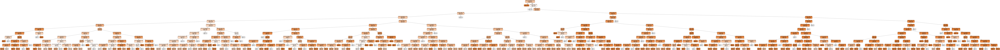

In [70]:
plot_dt(modelDT_base, feature_names=X_train_pca.columns)

#### Decision Tree - GridSearch

In [25]:
DT_Classifier_params = {'max_depth': [2,4,6,8,10,12],      #list(range(1, 4))+[None], #'max_depth': [None, 1,2,3,4,5],#list(range(1, 11))
                        'criterion' :['gini', 'entropy'], 
                        'max_features': [None, 'auto'],
                        #'min_samples_split': [2,  10],      #, 25, 50], #[2, 5, 10, 20, 30, 50],
                        #'min_samples_leaf': [1, 4],                             # [1, 2, 3, 4]
                        #'class_weight':['balanced']   # already done SMOTE    #,'ccp_alpha': [0, 0.001, 0.005, 0.01]
                       }

classifier = DecisionTreeClassifier(random_state=1)

In [26]:
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

DT_Classifier_gridsearch = GridSearchCV(estimator=classifier,
                                         param_grid=DT_Classifier_params,
                                         cv=kf,
                                         scoring='accuracy',
                                         n_jobs=-1,     
                                         verbose=1, 
                                         refit=True
                                       )

DT_Classifier_gridsearch.fit(X_train_pca, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   18.2s
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:   51.9s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=1, shuffle=True),
             estimator=DecisionTreeClassifier(random_state=1), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, 12],
                         'max_features': [None, 'auto']},
             scoring='accuracy', verbose=1)

In [27]:
print("Best score (Decision Tree GS): ", DT_Classifier_gridsearch.best_score_)
print("Best params (Decision Tree GS): ", DT_Classifier_gridsearch.best_params_)
print("Best estimator (Decision Tree GS): ", DT_Classifier_gridsearch.best_estimator_)

Best score (Decision Tree GS):  0.9736937635469717
Best params (Decision Tree GS):  {'criterion': 'gini', 'max_depth': 12, 'max_features': None}
Best estimator (Decision Tree GS):  DecisionTreeClassifier(max_depth=12, random_state=1)


In [28]:
test_score_DT_GS = DT_Classifier_gridsearch.best_estimator_.score(X_test_pca,y_test)

print('Decision Tree GS Score (Test): ', test_score_DT_GS)

Decision Tree GS Score (Test):  0.9657342962494273


In [29]:
importance_DT_GS = DT_Classifier_gridsearch.best_estimator_.feature_importances_
                  
importance_DT_GS_DF = pd.DataFrame({'variable': X_train_pca.columns,
                             'coef': importance_DT_GS,
                             'abs_coef': np.abs(importance_DT_GS), 
                            })
importance_DT_GS_DF.sort_values(by='abs_coef', ascending=False).head(12)

,variable,coef,abs_coef
35,TOTAL_INPT_DIAGNOSIS,0.823346,0.823346
33,NUM_INPT_ADM,0.170015,0.170015
26,TOTAL_DIAGNOSIS2009,0.002005,0.002005
34,TOTAL_INPT_COST,0.001925,0.001925
1,BENE_RACE_CD,0.000482,0.000482
36,TOTAL_INPT_PROCS,0.000431,0.000431
32,LOS,0.000259,0.000259
43,PTNT_PAY_RX_AMT,0.000152,0.000152
30,CHANGE_IN_DIAGNOSIS,0.000149,0.000149
27,TOTAL_PAYMENT2008,0.000139,0.000139


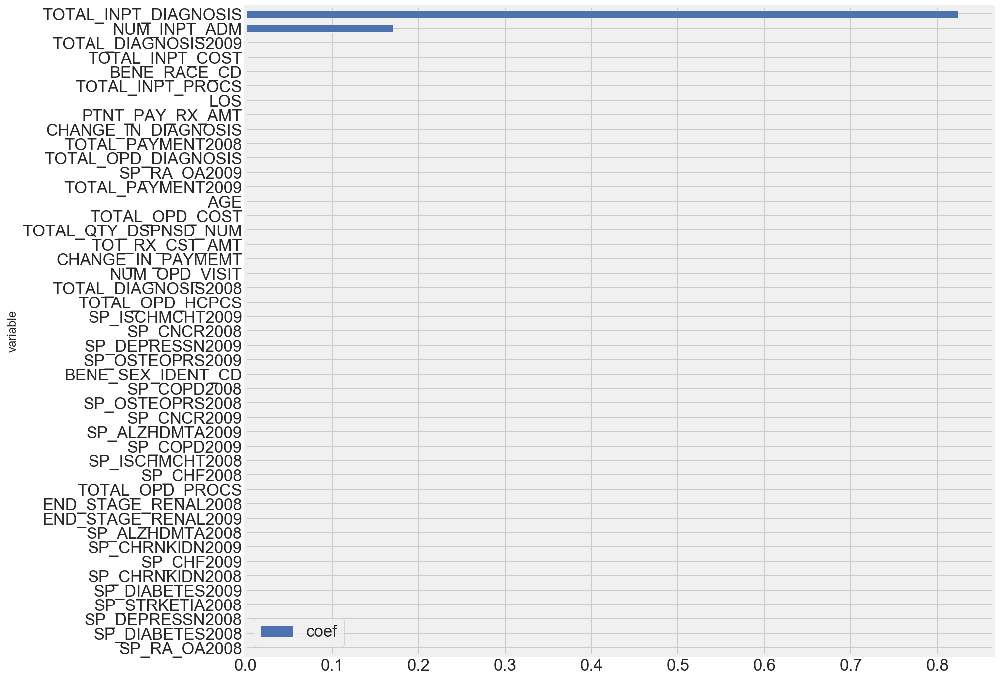

In [30]:
importance_DT_GS_DF.sort_values(by='abs_coef', ascending=True).plot(kind='barh',  y='coef', x='variable',
                      color='b', figsize=(12, 12))
plt.show()

In [31]:
# Predictons and Probabilities 
predictions_DT_GS = DT_Classifier_gridsearch.best_estimator_.predict(X_test_pca) 
#predictions_DT 
probabilities_DT_GS = DT_Classifier_gridsearch.best_estimator_.predict_proba(X_test_pca) 
#probabilities_DT

In [32]:
labels=[0, 1]
confusion_mat = confusion_matrix(y_test, predictions_DT_GS, labels=labels) # it is imp to put labels else its confusing
#print(labels)
#print(confusion_mat)

pd.DataFrame(confusion_mat,
             columns=['Predicted_No_Readmissions', 'Predicted_Readmissions'],
             index=['True_No_Readmissions', 'True_Readmissions'])


,Predicted_No_Readmissions,Predicted_Readmissions
True_No_Readmissions,18638,2094
True_Readmissions,1047,69887


In [33]:
print(classification_report(y_test, predictions_DT_GS))

              precision    recall  f1-score   support

           0       0.95      0.90      0.92     20732
           1       0.97      0.99      0.98     70934

    accuracy                           0.97     91666
   macro avg       0.96      0.94      0.95     91666
weighted avg       0.97      0.97      0.97     91666



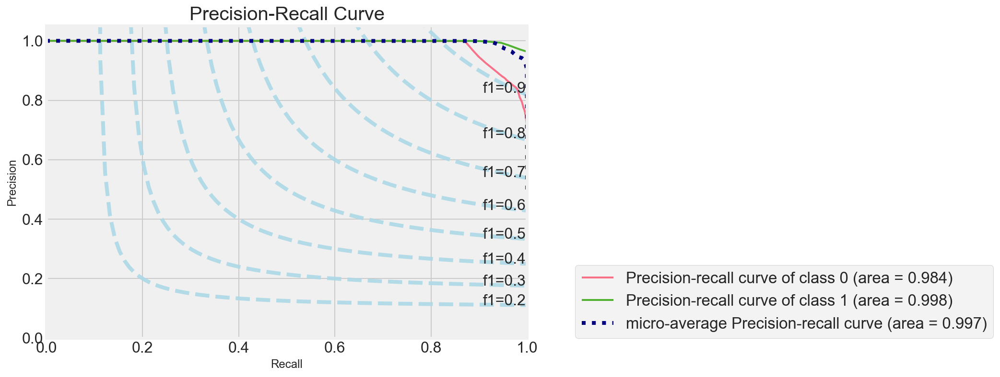

In [34]:
# Recall Precision plot

fig, ax = plot_f1_lines()
skplt.metrics.plot_precision_recall(y_test, probabilities_DT_GS, 
                       plot_micro=True, 
                       title_fontsize=20, text_fontsize=16, cmap=cmap, ax=ax)
ax.legend(loc=[1.1,0])
plt.show()

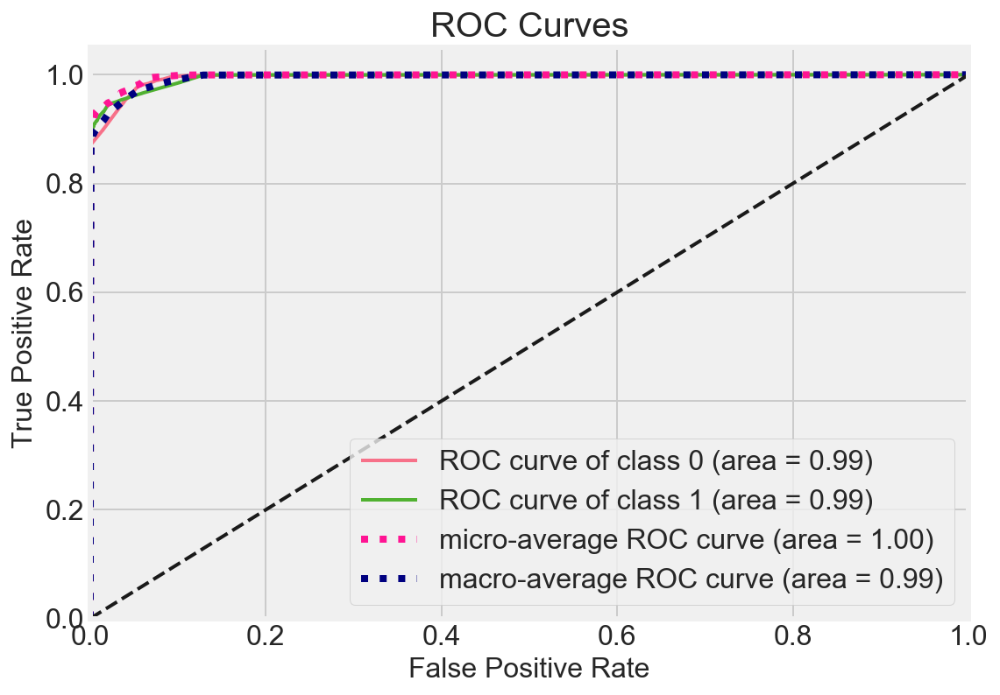

In [35]:
# ROC plot

skplt.metrics.plot_roc(y_test, probabilities_DT_GS, plot_micro=True, plot_macro=True, 
                       title_fontsize=20, text_fontsize=16, figsize=(8,6), cmap=cmap)
plt.show()

In [36]:
joblib.dump(DT_Classifier_gridsearch, 'DT_Classifier_gridsearch.jlib')

['DT_Classifier_gridsearch.jlib']

### KNN 

#### Base model KNN

In [89]:
# Base model KNN
modelknn_base = KNeighborsClassifier(n_neighbors=5)                                                                # n_neighbors=5
modelknn_base.fit(X_train_pca, y_train)

KNeighborsClassifier()

In [90]:
X_train_pca.shape, y_train.shape, X_test_pca.shape, y_test.shape

((567470, 45), (567470, 1), (91666, 45), (91666, 1))

In [ ]:
train_score_KNN_base = modelknn_base.score(X_train_pca, y_train)

In [ ]:
trainCV_score_KNN_base = cross_val_score(modelknn_base, X_train_pca, y_train, cv =5).mean()

In [ ]:
test_score_KNN_base = modelknn_base.score(X_test_pca, y_test)

In [ ]:
print("KNN Base Score(Train): ", train_score_KNN_base)

In [ ]:
print("KNN Base Cross Val Score (Train): ", trainCV_score_KNN_base) 

In [ ]:
print("KNN Base Score (Test): ", test_score_KNN_base)

In [91]:
joblib.dump(modelknn_base, 'modelknn_base.jlib')

['modelknn_base.jlib']

#### KNN GridSearch

In [94]:
gs_knn_params = {
                'n_neighbors': [5, 10],             #  25, 50], #[5, 15, 25, 35, 40, 45, 50, 60, 75],
                'weights': ['uniform', 'distance'],
                'metric': ['euclidean', 'manhattan']
                }

model_KNN = KNeighborsClassifier()

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

In [ ]:
knn_gridsearch = GridSearchCV(estimator=model_KNN,
                             param_grid=gs_knn_params,
                             cv=kf,
                             scoring='accuracy',
                             n_jobs=-1,                                      # runs on 3 cores
                             verbose=1)                                      # return_train_score=True
knn_gridsearch.fit(X_train_pca, y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


In [ ]:
datetime.now()

In [ ]:
# Printing parameters

print('Best Paramaters (KNN): ', knn_gridsearch.best_params_)
print('Best Score (KNN): ', knn_gridsearch.best_score_)
print('Best KNN ' , knn_gridsearch.best_estimator_)

In [ ]:
datetime.now()

In [ ]:
print('Test Score: ', knn_gridsearch.best_estimator_.score(X_test_pca,y_test))

In [ ]:
datetime.now()

In [ ]:
predictions_KNN = knn_gridsearch.best_estimator_.predict(X_test_pca)
#predictions_KNN

probabilities_KNN = knn_gridsearch.best_estimator_.predict_proba(X_test_pca)
#probabilities_KNN

In [ ]:
labels=[0, 1]
confusion_mat = confusion_matrix(y_test, predictions_KNN, labels=labels) # it is imp to put labels else its confusing
#print(labels)
#print(confusion_mat)

pd.DataFrame(confusion_mat,
             columns=['Predicted_No_Readmissions', 'Predicted_Readmissions'],
             index=['True_No_Readmissions', 'True_Readmissions'])

In [ ]:
print(classification_report(y_test, predictions_KNN))

In [ ]:
datetime.now()

In [ ]:
joblib.dump(knn_gridsearch, 'knn_gridsearch.jlib')

### SVM

In [ ]:
# Base model  # took 1hr 30 mins to initialize the object in AWS

modelSVM_base = SVC(kernel='linear',C=1, degree=5, coef0=1.5,   # kernel='rbf' is slow
              decision_function_shape='ovr', gamma='scale')

modelSVM_base.fit(X_train_pca, y_train)

In [ ]:
modelSVM_base_score = modelSVM.score(X_train_pca, y_train)
modelSVM_base_CV = cross_val_score(modelSVM, X_train_pca, y_train, cv =5).mean()
modelSVM_base_test = modelSVM.score(X_test_pca, y_test)

print("SVM Base Score(Train): ", modelSVM_base_score)
print("SVM Base Cross Val Score (Train): ", modelSVM_base_CV) 
print("SVM Base Score (Test): ", modelSVM_base_test)

In [ ]:
datetime.now() # takes over 5 hrs 0 mins in AWS

In [ ]:
joblib.dump(modelSVM_base, 'modelSVM_base.jlib')

#### SVM GridSearch

In [ ]:

gs_SVM_params = {'gamma': np.linspace(0.01, 2, 2),  #np.linspace(0.01, 2, 10),
                'kernel': ['rbf'],#,'linear', 'poly'],#, 'rbf', 'sigmoid'],  # , 'precomputed'
                'C': np.logspace(-2, 2, 2)}   

modelSVM_GS = SVC()

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

SVM_gridsearch = GridSearchCV(estimator=modelSVM_GS,
                             param_grid=gs_SVM_params,
                             cv=kf,
                             #scoring='accuracy',
                             n_jobs=3,     # runs on 3 cores
                             verbose=1,
                             error_score = 0.0)


SVM_gridsearch.fit(X_train_pca, y_train)

In [ ]:
datetime.now()

In [ ]:
print('Best Paramaters (SVM): ', SVM_gridsearch.best_params_)
print('Best Score (SVM): ', SVM_gridsearch.best_score_)
print('Best SVM: ' , SVM_gridsearch.best_estimator_)

In [ ]:
datetime.now()

In [ ]:
SVM_gridsearch_score = SVM_gridsearch.best_estimator_.score(X_test_pca,y_test)

print('Test Score: ' , SVM_gridsearch_score)

In [ ]:
joblib.dump(SVM_gridsearch, 'SVM_gridsearch.jlib')

### Neural Network

In [22]:
from sklearn.neural_network import MLPClassifier

NN_base = MLPClassifier(solver='adam',
                    alpha=10**(0),
                    hidden_layer_sizes=(8, 8, 8),
                    activation='relu',
                    random_state=42,
                    batch_size=50,        # how many observations to look at at a time and then the next batch
                    max_iter=1000          # number of epcohs
                  , early_stopping=True
                  , validation_fraction = 0.1 # after each epoch validates if the model out performs,
                                               # if not return to previous step and dont iterate any more
                  #,learning_rate='constant'
                  #,learning_rate_init=0.001
                   ,verbose=1)

NN_base.fit(X_train_pca, y_train)

Iteration 1, loss = 0.27489631
Validation score: 0.960474
Iteration 2, loss = 0.23818221
Validation score: 0.961231
Iteration 3, loss = 0.23798137
Validation score: 0.961866
Iteration 4, loss = 0.23788700
Validation score: 0.961108
Iteration 5, loss = 0.23787028
Validation score: 0.961196
Iteration 6, loss = 0.23783545
Validation score: 0.961584
Iteration 7, loss = 0.23777422
Validation score: 0.961513
Iteration 8, loss = 0.23779086
Validation score: 0.961320
Iteration 9, loss = 0.23778591
Validation score: 0.961390
Iteration 10, loss = 0.23780103
Validation score: 0.961372
Iteration 11, loss = 0.23778713
Validation score: 0.961179
Iteration 12, loss = 0.23782168
Validation score: 0.961161
Iteration 13, loss = 0.23780518
Validation score: 0.961320
Iteration 14, loss = 0.23773050
Validation score: 0.961566
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.


MLPClassifier(alpha=1, batch_size=50, early_stopping=True,
              hidden_layer_sizes=(8, 8, 8), max_iter=1000, random_state=42,
              verbose=1)

In [23]:
from sklearn.metrics import accuracy_score

NN_base_test_score = accuracy_score(y_test, NN_base.predict(X_test_pca))
print('NN Test score - base:', NN_base_test_score)

NN Test score - base: 0.9461414264831017


In [24]:
''' # It doesnt work this way...

importance_nn_base = NN_base.coefs_
#importance_nn_base
         
importanceDF_nn_base = pd.DataFrame({#'variable': X_train_pca.columns,
                             'coef': importance_nn_base,
                             'abs_coef': np.abs(importance_nn_base), 
                            })
importanceDF_nn_base.sort_values(by='abs_coef', ascending=False).head(12)


importanceDF_nn_base.sort_values(by='abs_coef', ascending=True).plot(kind='barh',  y='coef', x='variable',
                      color='b', figsize=(12, 12))
plt.show()

'''

" # It doesnt work this way...\n\nimportance_nn_base = NN_base.coefs_\n#importance_nn_base\n         \nimportanceDF_nn_base = pd.DataFrame({#'variable': X_train_pca.columns,\n                             'coef': importance_nn_base,\n                             'abs_coef': np.abs(importance_nn_base), \n                            })\nimportanceDF_nn_base.sort_values(by='abs_coef', ascending=False).head(12)\n\n\nimportanceDF_nn_base.sort_values(by='abs_coef', ascending=True).plot(kind='barh',  y='coef', x='variable',\n                      color='b', figsize=(12, 12))\nplt.show()\n\n"

In [38]:
# Predictons and Probabilities

predictions_nn_base = NN_base.predict(X_test_pca)
#predictions_nn_base

probabilities_nn_base = NN_base.predict_proba(X_test_pca)
#probabilities_nn_base

In [39]:
labels=[0, 1]
confusion_mat = confusion_matrix(y_test, predictions_nn_base, labels=labels) # it is imp to put labels else its confusing
#print(labels)
#print(confusion_mat)

pd.DataFrame(confusion_mat,
             columns=['Predicted_No_Readmissions', 'Predicted_Readmissions'],
             index=['True_No_Readmissions', 'True_Readmissions'])

,Predicted_No_Readmissions,Predicted_Readmissions
True_No_Readmissions,20376,356
True_Readmissions,4200,66734


In [40]:
print(classification_report(y_test, predictions_nn_base))

              precision    recall  f1-score   support

           0       0.83      0.98      0.90     20732
           1       0.99      0.94      0.97     70934

    accuracy                           0.95     91666
   macro avg       0.91      0.96      0.93     91666
weighted avg       0.96      0.95      0.95     91666



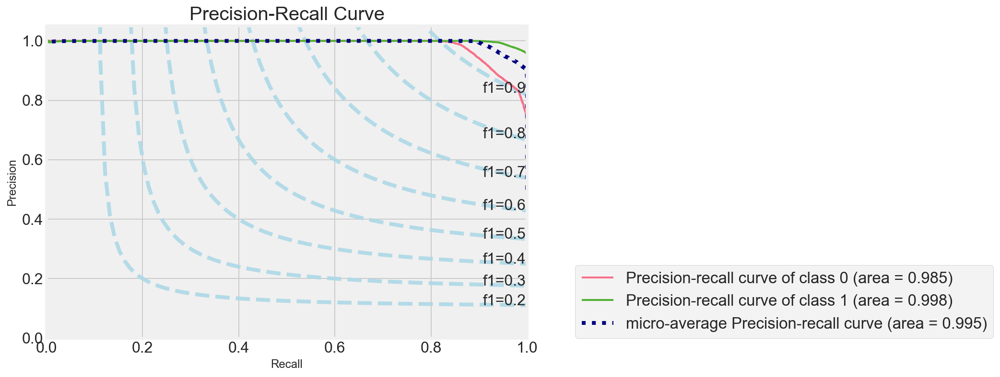

In [41]:
# Recall Precision plot

fig, ax = plot_f1_lines()
skplt.metrics.plot_precision_recall(y_test, probabilities_nn_base, 
                       plot_micro=True, 
                       title_fontsize=20, text_fontsize=16, cmap=cmap, ax=ax)
ax.legend(loc=[1.1,0])
plt.show()

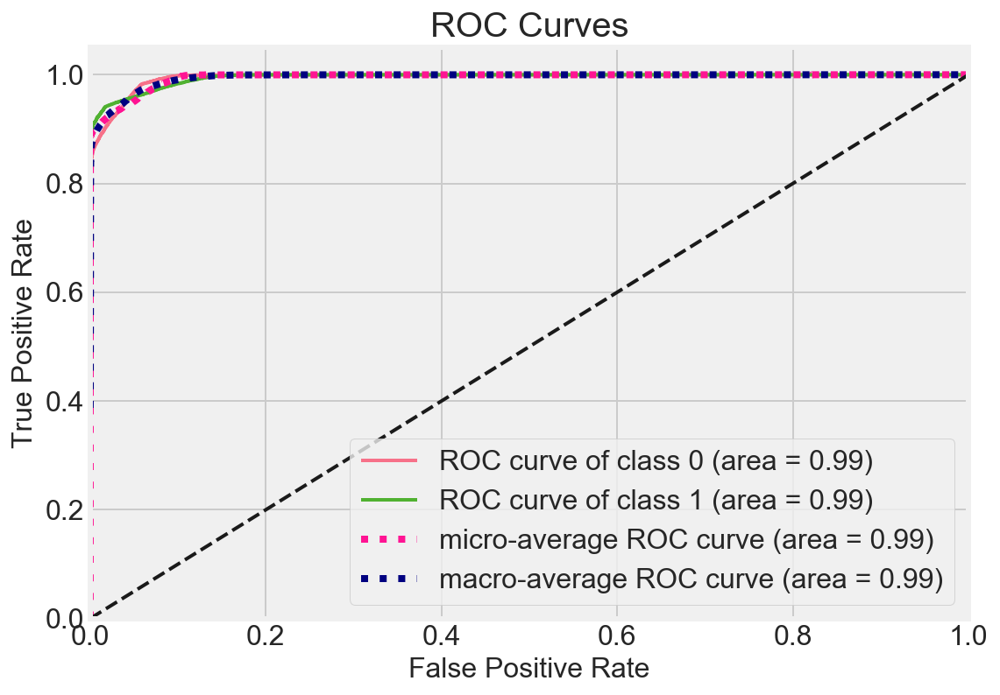

In [42]:
# ROC plot

skplt.metrics.plot_roc(y_test, probabilities_nn_base, plot_micro=True, plot_macro=True, 
                       title_fontsize=20, text_fontsize=16, figsize=(8,6), cmap=cmap)
plt.show()

In [43]:
joblib.dump(NN_base, 'NN_base.jlib')

['NN_base.jlib']

### Naive Bayes

In [25]:
# To convert into Normal Distibution for GaussianNB()

from sklearn.preprocessing import PowerTransformer

power = PowerTransformer(method='yeo-johnson',standardize=True, copy=True)
X_trainp = power.fit_transform(X_train_pca)
X_testp = power.transform(X_test_pca)


In [26]:
from sklearn import naive_bayes #import GaussianNB
#from sklearn.naive_bayes import GaussianNB   # this is also correct

#model_NB_Base = naive_bayes.MultinomialNB()

model_NB_Base = naive_bayes.GaussianNB() # works for normal distributed features
model_NB_Base.fit(X_trainp, y_train)

GaussianNB()

In [27]:
model_NB_Base_train_score = model_NB_Base.score(X_trainp, y_train)
model_NB_Base_CV_score = cross_val_score(model_NB_Base, X_trainp, y_train, cv=5).mean()
model_NB_Base_test_score = model_NB_Base.score(X_testp, y_test)

print("Naive Bayes Base Score(Train): ", model_NB_Base_train_score)
print("Naive Bayes Base Cross Val Score (Train): ", model_NB_Base_CV_score) 
print("Naive Bayes Base Score (Test): ", model_NB_Base_test_score)

Naive Bayes Base Score(Train):  0.9046134597423653
Naive Bayes Base Cross Val Score (Train):  0.9043790861190901
Naive Bayes Base Score (Test):  0.8801736739903563


In [17]:
# Predictons and Probabilities

predictions_NB_Base = model_NB_Base.predict(X_testp)
#predictions_NB_Base

probabilities_NB_Base = model_NB_Base.predict_proba(X_testp)
#probabilities_NB_Base


In [18]:
labels=[0, 1]
confusion_mat = confusion_matrix(y_test, predictions_NB_Base, labels=labels) # it is imp to put labels else its confusing
#print(labels)
#print(confusion_mat)

pd.DataFrame(confusion_mat,
             columns=['Predicted_No_Readmissions', 'Predicted_Readmissions'],
             index=  ['True_No_Readmissions', 'True_Readmissions'])

,Predicted_No_Readmissions,Predicted_Readmissions
True_No_Readmissions,19883,849
True_Readmissions,6179,64755


In [19]:
print(classification_report(y_test, predictions_NB_Base))

              precision    recall  f1-score   support

           0       0.76      0.96      0.85     20732
           1       0.99      0.91      0.95     70934

    accuracy                           0.92     91666
   macro avg       0.87      0.94      0.90     91666
weighted avg       0.94      0.92      0.93     91666



In [21]:
def plot_f1_lines(figsize=(8,6),fontsize=16):
    '''Create f1-score level lines to be added to the precison-recall plot'''

    fig, ax = plt.subplots(figsize=figsize)
    
    # add lines of constant F1 scores
    
    for const in np.linspace(0.2,0.9,8):
        x_vals = np.linspace(0.001, 0.999, 100)
        y_vals = 1./(2./const-1./x_vals)
        ax.plot(x_vals[y_vals > 0], y_vals[y_vals > 0],
                 color='lightblue', ls='--', alpha=0.9)
        ax.set_ylim([0, 1])
        ax.annotate('f1={0:0.1f}'.format(const),
                     xy=(x_vals[-10], y_vals[-2]+0.0), fontsize=fontsize)

    return fig, ax

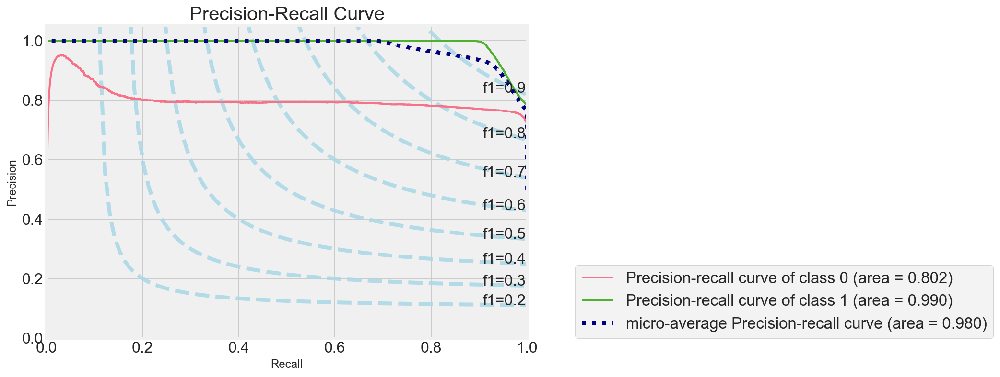

In [22]:
# Recall Precision plot

fig, ax = plot_f1_lines()
skplt.metrics.plot_precision_recall(y_test, probabilities_NB_Base, 
                       plot_micro=True, 
                       title_fontsize=20, text_fontsize=16, cmap=cmap, ax=ax)
ax.legend(loc=[1.1,0])
plt.show()

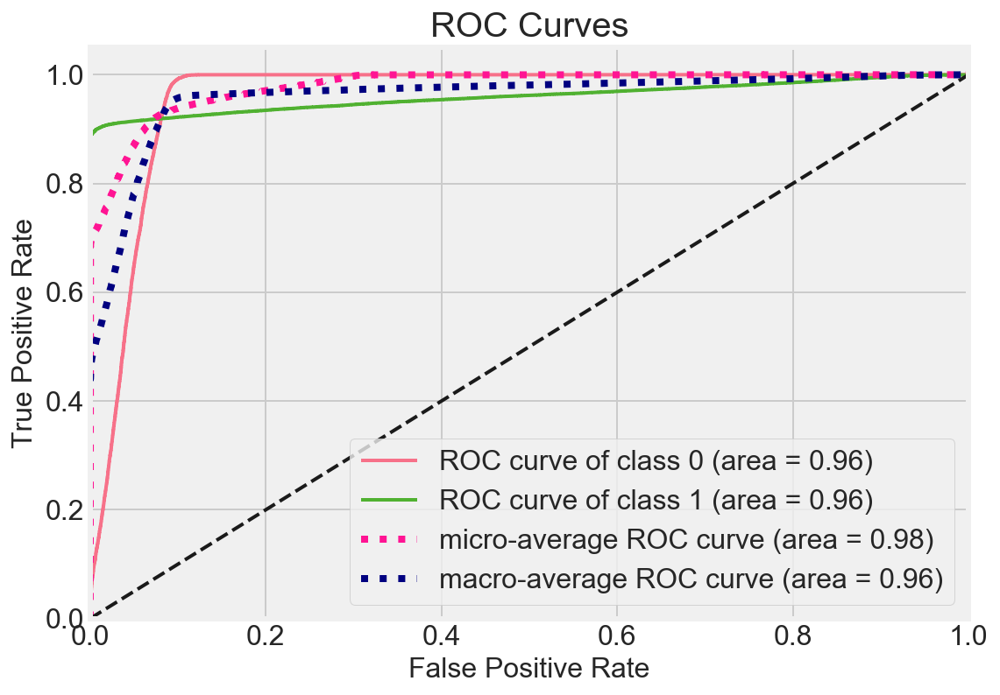

In [23]:
# ROC plot

skplt.metrics.plot_roc(y_test, probabilities_NB_Base, plot_micro=True, plot_macro=True, 
                       title_fontsize=20, text_fontsize=16, figsize=(8,6), cmap=cmap)
plt.show()

In [24]:
joblib.dump(model_NB_Base, 'model_NB_Base.jlib')

['model_NB_Base.jlib']

### ADA Boost

In [13]:
#base_estimator = DecisionTreeClassifier(max_depth=12)
model_ADA_base = AdaBoostClassifier(
                                    base_estimator=modelDT_base,    #base_estimator,
                                    n_estimators=100,
                                    random_state=1,
                                    algorithm='SAMME'
                                   )

model_ADA_base.fit(X_train_pca, y_train)

ValueError: BaseClassifier in AdaBoostClassifier ensemble is worse than random, ensemble can not be fit.

In [ ]:
model_ada_base_score =  model_ADA_base.score(X_train_pca, y_train)
model_ada_base_CV_score = cross_val_score(model_ADA_base, X_train_pca, y_train, cv=5).mean()
model_ada_base_test_score = model_ADA_base.score(X_test_pca, y_test)

print("ADA Boost Base Score(Train): ", model_ada_base_score)
print("ADA Boost Base Cross Val Score (Train): ", model_ada_base_CV_score) 
print("ADA Boost Base Score (Test): ", model_ada_base_test_score)

In [ ]:
joblib.dump(model_ADA_base, 'model_ADA_base.jlib')

### Gradient Boost

In [14]:
modelGB_Base = GradientBoostingClassifier(
                                            n_estimators=100,
                                            criterion='mse',
                                            loss='exponential',
                                            max_depth=3,
                                            learning_rate=1.0,
                                            random_state=1
                                          )

modelGB_Base.fit(X_train_pca, y_train)

GradientBoostingClassifier(criterion='mse', learning_rate=1.0,
                           loss='exponential', random_state=1)

In [15]:
modelGB_Base_score =  modelGB_Base.score(X_train_pca, y_train)
modelGB_Base_CV_score = cross_val_score(modelGB_Base, X_train_pca, y_train, cv=5).mean()
modelGB_Base_test_score = modelGB_Base.score(X_test_pca, y_test)

print("Gradient Boost Base Score(Train): ", modelGB_Base_score)
print("Gradient Boost Base Cross Val Score (Train): ", modelGB_Base_CV_score) 
print("Gradient Boost Base Score (Test): ", modelGB_Base_test_score)

Gradient Boost Base Score(Train):  0.9809434859992598
Gradient Boost Base Cross Val Score (Train):  0.9760427864028054
Gradient Boost Base Score (Test):  0.9687670455785133


In [16]:
importance_GBbase = modelGB_Base.feature_importances_
                  
importanceDF_GBbase = pd.DataFrame({'variable': X_train_pca.columns,
                             'coef': importance_GBbase,
                             'abs_coef': np.abs(importance_GBbase), 
                            })
importanceDF_GBbase.sort_values(by='abs_coef', ascending=False).head(12)

,variable,coef,abs_coef
35,TOTAL_INPT_DIAGNOSIS,0.707864,0.707864
33,NUM_INPT_ADM,0.281526,0.281526
34,TOTAL_INPT_COST,0.002905,0.002905
36,TOTAL_INPT_PROCS,0.002395,0.002395
26,TOTAL_DIAGNOSIS2009,0.001354,0.001354
1,BENE_RACE_CD,0.000695,0.000695
32,LOS,0.000580,0.000580
28,TOTAL_PAYMENT2009,0.000339,0.000339
29,CHANGE_IN_PAYMEMT,0.000310,0.000310
38,TOTAL_OPD_COST,0.000256,0.000256


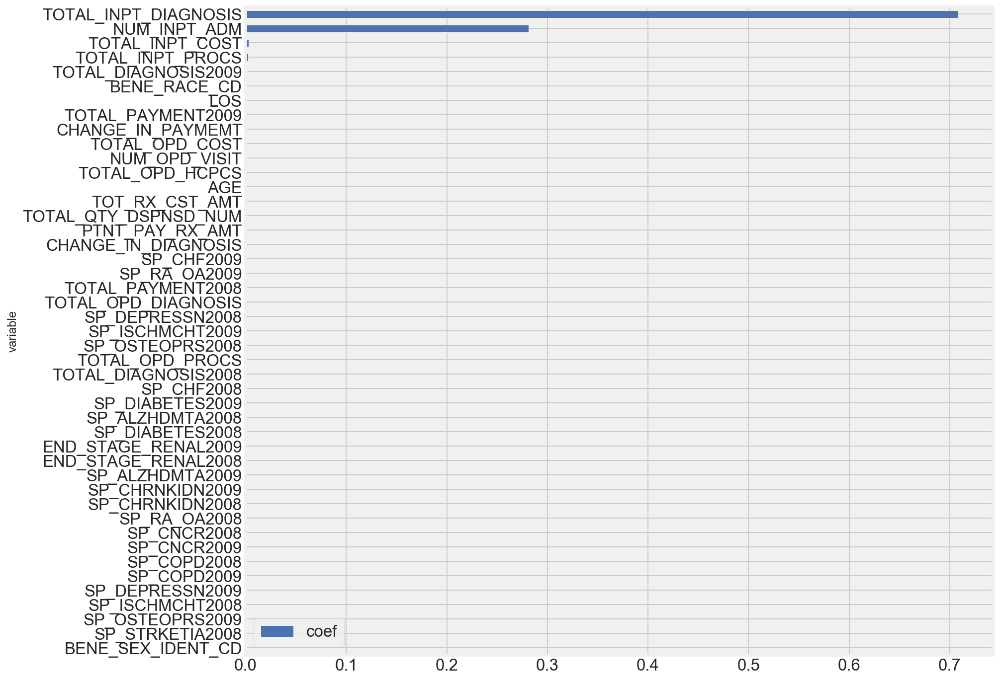

In [17]:
importanceDF_GBbase.sort_values(by='abs_coef', ascending=True).plot(kind='barh',  y='coef', x='variable',
                      color='b', figsize=(12, 12))
plt.show()

In [20]:
# Predictons and Probabilities

predictions_GB_Base = modelGB_Base.predict(X_test_pca)
#predictions_GB_Base

probabilities_GB_Base = modelGB_Base.predict_proba(X_test_pca)
#predictions_GB_Base

In [21]:
labels=[0, 1]
confusion_mat = confusion_matrix(y_test, predictions_GB_Base, labels=labels) # it is imp to put labels else its confusing
#print(labels)
#print(confusion_mat)

pd.DataFrame(confusion_mat,
             columns=['Predicted_No_Readmissions', 'Predicted_Readmissions'],
             index=  ['True_No_Readmissions', 'True_Readmissions'])

,Predicted_No_Readmissions,Predicted_Readmissions
True_No_Readmissions,18372,2360
True_Readmissions,503,70431


In [22]:
print(classification_report(y_test, predictions_GB_Base))

              precision    recall  f1-score   support

           0       0.97      0.89      0.93     20732
           1       0.97      0.99      0.98     70934

    accuracy                           0.97     91666
   macro avg       0.97      0.94      0.95     91666
weighted avg       0.97      0.97      0.97     91666



In [24]:
def plot_f1_lines(figsize=(8,6),fontsize=16):
    '''Create f1-score level lines to be added to the precison-recall plot'''

    fig, ax = plt.subplots(figsize=figsize)
    
    # add lines of constant F1 scores
    
    for const in np.linspace(0.2,0.9,8):
        x_vals = np.linspace(0.001, 0.999, 100)
        y_vals = 1./(2./const-1./x_vals)
        ax.plot(x_vals[y_vals > 0], y_vals[y_vals > 0],
                 color='lightblue', ls='--', alpha=0.9)
        ax.set_ylim([0, 1])
        ax.annotate('f1={0:0.1f}'.format(const),
                     xy=(x_vals[-10], y_vals[-2]+0.0), fontsize=fontsize)

    return fig, ax

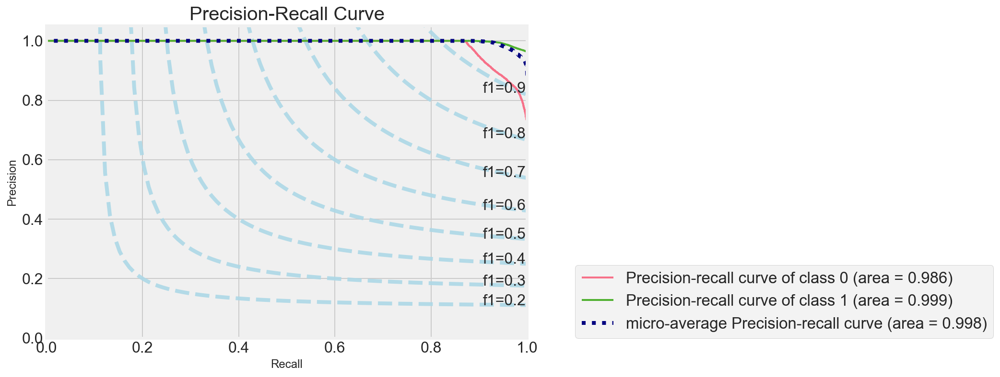

In [25]:
# Recall Precision plot

fig, ax = plot_f1_lines()
skplt.metrics.plot_precision_recall(y_test, probabilities_GB_Base, 
                       plot_micro=True, 
                       title_fontsize=20, text_fontsize=16, cmap=cmap, ax=ax)
ax.legend(loc=[1.1,0])
plt.show()

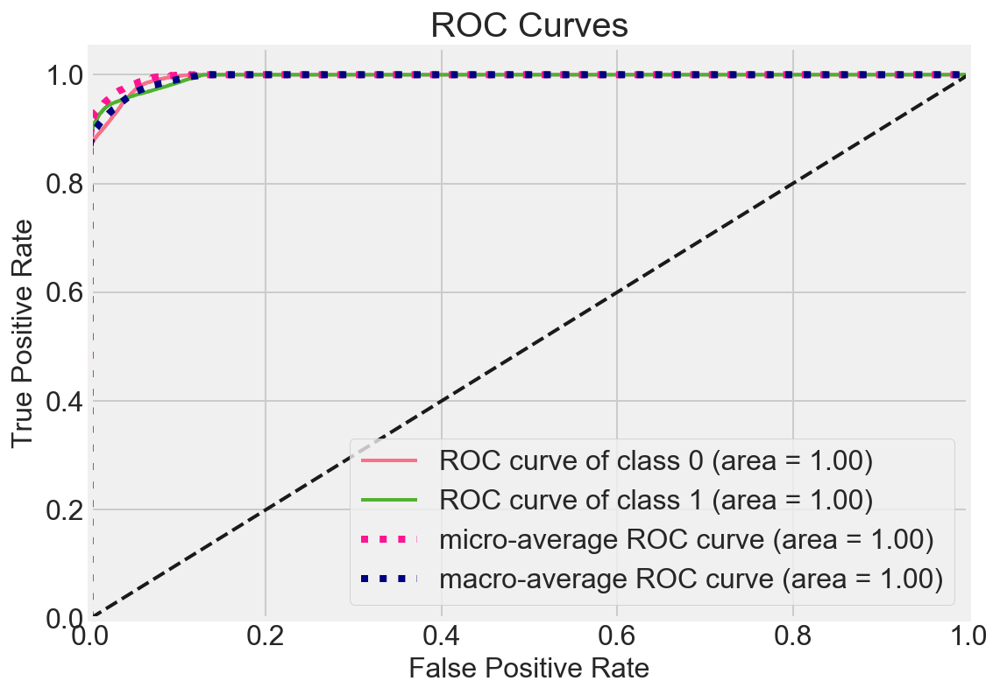

In [26]:
# ROC plot

skplt.metrics.plot_roc(y_test, probabilities_GB_Base, plot_micro=True, plot_macro=True, 
                       title_fontsize=20, text_fontsize=16, figsize=(8,6), cmap=cmap)
plt.show()

In [18]:
joblib.dump(modelGB_Base, 'modelGB_Base.jlib')

['modelGB_Base.jlib']

In [ ]:
### ----------- To Delete from here -------------------------

In [ ]:
# use this https://medium.com/modern-nlp/10-great-ml-practices-for-python-developers-b089eefc18fc 

In [ ]:
def grid_search_func(estimator, params, X_train, y_train, X_test, y_test, scoring_function=metrics.accuracy_score, scoring='accuracy', cv=5):
    gs = GridSearchCV(
        estimator=estimator,
        param_grid=params,
        return_train_score=True,
        scoring=scoring,
        cv=cv)

    gs.fit(X_train, y_train)
    datetime.now()
    
    print("Best score")
    print(gs.best_score_)
    print()
    print("Best estimator")
    print(gs.best_estimator_.get_params())
    print()
    datetime.now()

    predictions = gs.best_estimator_.predict(X_test)
    print('Test score: ', scoring_function(y_test, predictions))
    print()
    print_cm_cr(y_test, predictions)
    datetime.now()
    
    return gs

In [ ]:
params_rbf = {'C': np.logspace(-2, 2, 11),
              'gamma': np.linspace(0.01, 2, 10)}

gs_rbf = grid_search_func(model_rbf, params_rbf,
                          X_train, y_train, X_test, y_test)

In [ ]:
datetime.now()

In [ ]:
# Write function for diff models and grid search pipeline
try with and without over sampling
LR,
KNN,
DT,
RF
SVM
AdaBoost?
change threshold of probability and see if the accuracy gets better
is recall or precision more imp for me 

death prediction
cost prediction
disease prediction

d0 ensembling ??

In [ ]:
#week 5 day 1

pipe = Pipeline(steps=[('scaler', scaler),
                       ('model', model)])

pipe.fit(X, y)

columns_to_drop = ['PassengerId', 'Name']
columns_to_dummify = ['Sex', 'Pclass', 'Embarked']

tprep = TitanticPreprocessor(columns_to_drop=columns_to_drop,
                             columns_to_dummify=columns_to_dummify)
scaler = StandardScaler()
model = LogisticRegression(solver='lbfgs', random_state=1)

pipe = Pipeline(steps=[('titanic_prep', tprep),
                       ('scaler', scaler),
                       ('model', model)
                      ]
               )


scaler = StandardScaler()
#scaler = MinMaxScaler()
poly = PolynomialFeatures(include_bias=False)
model = LogisticRegression(solver='lbfgs')
#model = KNeighborsClassifier()
fu_pipe = Pipeline(steps=(('union', fu),
                          ('poly', poly),
                          ('scaler', scaler),
                          ('model', model)))

In [ ]:
# setup the grid search

params = {'C': np.logspace(-4, 4, 10),
          'penalty': ['l1', 'l2'],
          'fit_intercept': [True, False]}

gs = GridSearchCV(estimator=model,
                  param_grid=params,
                  cv=5,
                  scoring='accuracy',
                  return_train_score=True)

gs.fit(X_train, y_train)

# extract the grid search results

print('Best Parameters:')
print(gs.best_params_)
print('Best estimator C:')
print(gs.best_estimator_.C)
print('Best estimator mean cross validated training score:')
print(gs.best_score_)
print('Best estimator score on the full training set:')
print(gs.score(X_train, y_train))
print('Best estimator score on the test set:')
print(gs.score(X_test, y_test))
print('Best estimator coefficients:')
print(gs.best_estimator_.coef_)

In [ ]:
refer this - https://towardsdatascience.com/imbalanced-class-sizes-and-classification-models-a-cautionary-tale-part-2-cf371500d1b3
    
    
    
    models = [{'name': 'logreg','label': 'Logistic Regression',
           'classifier': LogisticRegression(random_state=88),
           'grid': {"C":np.logspace(-3,3,7), "penalty":["l1","l2"]}},
          
          {'name': 'knn','label':'K Nearest Neighbors',
           'classifier':KNeighborsClassifier(),
           'grid': {"n_neighbors":np.arange(8)+1}},
          
          {'name': 'dsc','label': 'Descision Tree', 
           'classifier': DecisionTreeClassifier(random_state=88),
           'grid': {"max_depth":np.arange(8)+1}},
          
          {'name': 'rf', 'label': 'Random Forest',
           'classifier': RandomForestClassifier(random_state=88),
           'grid': {'n_estimators': [200, 500],'max_features': ['auto', 'sqrt', 'log2'],
                    'max_depth' : [4,5,6,7,8],'criterion' :['gini', 'entropy']}},
          
          {'name': 'svm_rbf', 'label': 'SVC (RBF)',
           'classifier':SVC(random_state=88),
           'grid': {'C': [1, 10, 100, 1000], 'gamma': [0.001, 0.0001], 'kernel': ['rbf']}}]

In [ ]:
# Can I find imp features (rev engg PCAs to real feature) - https://towardsdatascience.com/feature-extraction-using-principal-component-analysis-a-simplified-visual-demo-e5592ced100a

In [ ]:
# Can i do deeper analytics to find which diseases are mostly like for readmssion or mots/leat expenseive so that we 

# can target the low hanging fruits

In [ ]:
# Can i look at probablities and figure out the index and relate to the patient